# Image Retrieval

In [1]:
import cv2
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import random
from collections import OrderedDict
def load_images_from_folder1(folder):
    images = []
    names=[]
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        names.append(filename)
        if img is not None:
            images.append(img)
    return images,names

In [2]:
images,names=load_images_from_folder1('smallholidays')

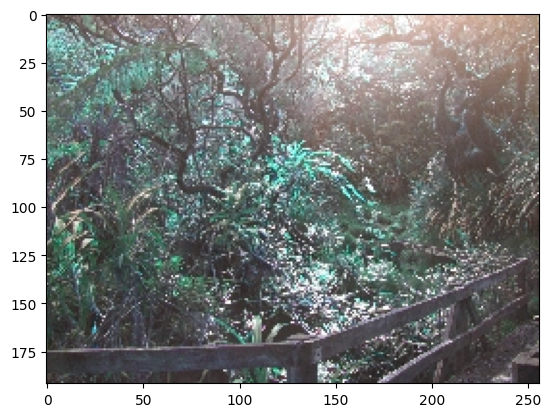

In [3]:
imgplot = plt.imshow(images[67])
plt.show()

In [4]:
vectors=[]
for i in images:
    image = cv2.resize(i, (16, 16))
    im_array = np.array(image)

    # Flatten the pixels of the image into a 1D vector
    pixels = im_array.flatten()
    vectors.append(pixels)
len(vectors)

1491

In [5]:
vectors

[array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 254, 255, 250,
        255, 254, 243, 255, 254, 244, 254, 250, 242, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 251, 255, 255, 245, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 252, 255, 255, 250, 255, 254,
        244, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255

# First Question

### What interpolation method is used when you resize the images ? Comment on what properties of the image are preserved at this low resolution of 16x16 ? Why would it be a good idea to compare images pixel by pixel at this resolution rather than at full resolution ?

By default, the resize() function in the Pillow library uses the BICUBIC interpolation method to resize images. The BICUBIC method is a commonly used interpolation method that uses a cubic spline to smooth the image and reduce aliasing.

When you resize an image to a low resolution such as 16x16, the resulting image will be much lower in detail and resolution than the original image. Some information and details from the original image will be lost during the resizing process.

However, comparing images pixel by pixel at this low resolution can still be a useful technique for certain applications. For example, if you are trying to identify patterns or features in the images that are not sensitive to small variations in pixel values, then comparing the images at this low resolution may be sufficient. Additionally, comparing images at this low resolution can also be faster and require less computational resources than comparing them at full resolution.

## Get the query images

In [6]:
query_index=[]
for i in range(len(names)):
    print
    if names[i].endswith('00.jpg'):
        query_index.append(i)

# choose a random query image

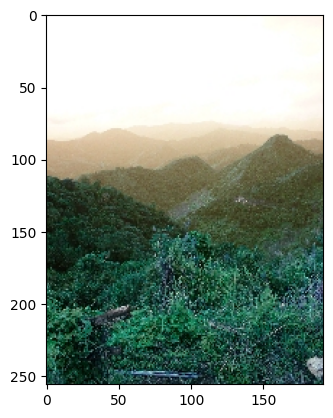

In [7]:

random.seed(121)

item = random.choice(query_index)
item=0
imgplot = plt.imshow(images[item])
plt.show()

# compute the distance

In [8]:

def calculate_dist(item):
    distances={}
    for i in range(len(vectors)):

        distances[i]=np.linalg.norm(vectors[item]-vectors[i] )
    sorted_dist = dict(OrderedDict(sorted(distances.items(), key=lambda t: t[1])))
    return sorted_dist
sorted_dist=calculate_dist(item)
sorted_dist

{0: 0.0,
 22: 2601.6513986312616,
 136: 2698.831228513558,
 755: 2812.8032280982616,
 725: 2833.3497842659667,
 2: 2833.461663760426,
 724: 2838.611808613499,
 757: 2868.466489258677,
 756: 2900.8958960983073,
 1082: 2955.7533726615284,
 581: 2956.938957773731,
 720: 2978.285244901838,
 729: 3007.336196702989,
 383: 3023.7066656671577,
 24: 3067.0971618127783,
 1449: 3088.5684386135918,
 1199: 3100.934536555069,
 716: 3135.6158884659326,
 579: 3169.5357704244325,
 712: 3171.2095484215483,
 220: 3182.3084388537827,
 733: 3229.137036423199,
 1083: 3237.3481431566793,
 1450: 3240.4200345017002,
 1200: 3251.8328677839518,
 32: 3261.8002697896754,
 1342: 3280.2521244562895,
 798: 3295.902000970296,
 1298: 3309.944410409335,
 322: 3315.784220964929,
 892: 3330.656692005347,
 1084: 3338.445147070714,
 72: 3340.201191545204,
 1152: 3344.2372822513657,
 1007: 3346.6731241637567,
 753: 3363.0359795874915,
 715: 3376.7802712051016,
 41: 3388.71066926641,
 221: 3393.290438497713,
 718: 3393.835588

# plot the images
    

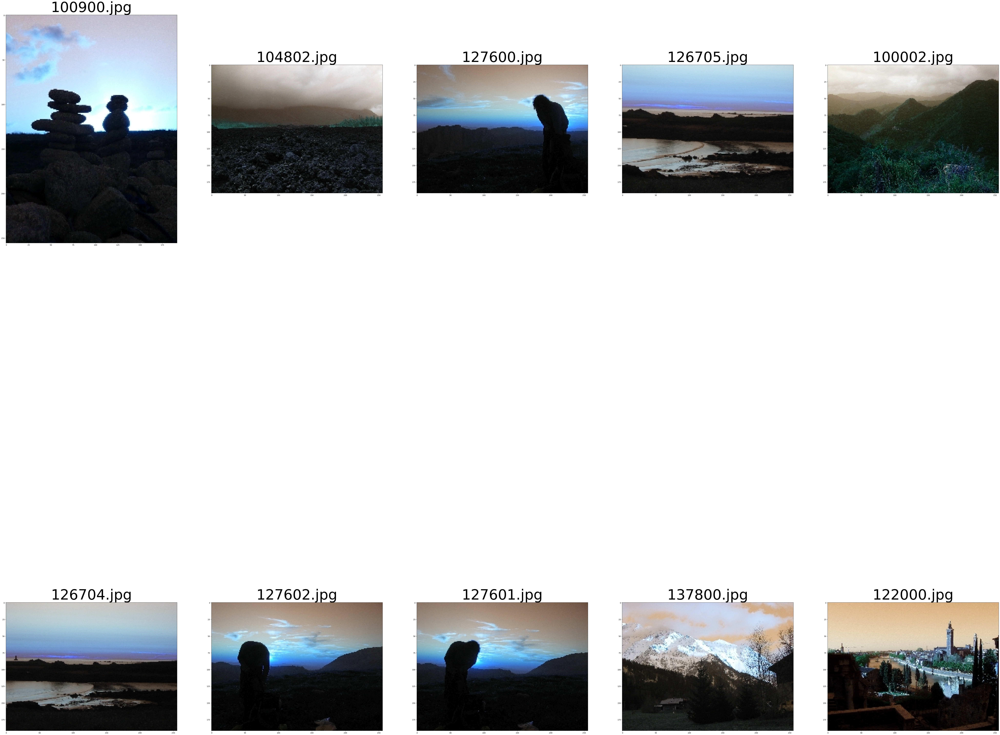

100000.jpg


In [9]:
nrows = 2
ncols = 5
plt.figure(figsize=(100,100))
keys=sorted_dist.keys()
first10=list(keys)[1:11]
# Loop through the images and plot them
for i in range(10):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(images[first10[i]])
    plt.title(names[first10[i]],fontsize=80)
# Show the plot
plt.show()

print(names[item])

# get the relevant images of the query

In [10]:
def get_relevant(query):

    
    relevant=[]
    for i in names:
        if (i.startswith(query[:4]) and i!=query):
            relevant.append(i)
    return relevant
relevant=get_relevant(names[item])
relevant

['100001.jpg', '100002.jpg']

# precision recall for this query

In [11]:

def precision_recall(relevant_images, retrieved_images):

    relevant_images = set(relevant_images)
    num_retrieved = len(retrieved_images)

    # Calculate precision and recall values for each position in the retrieved list
    precision_values = []
    recall_values = []
    num_relevant_retrieved = 0
    for i in range(num_retrieved):
        if retrieved_images[i] in relevant_images:
            num_relevant_retrieved += 1

        precision = num_relevant_retrieved / (i+1)
        recall = num_relevant_retrieved / len(relevant_images)
        precision_values.append(precision)
        recall_values.append(recall)

    # Plot the precision and recall curves against the number of retrieved images
    num_retrieved_values = np.arange(1, num_retrieved+1)
    plt.plot(num_retrieved_values, precision_values, '-o', label='Precision')
    plt.plot(num_retrieved_values, recall_values, '-o', label='Recall')
    plt.xlabel('Number of Retrieved Images')
    plt.ylabel('Precision/Recall')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, num_retrieved+1])
    plt.title('Precision-Recall Curve')
    plt.legend(loc='lower left')
    plt.show()


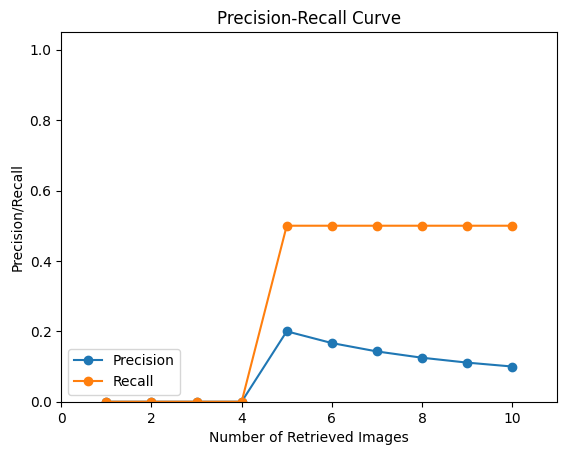

In [12]:
precision_recall(relevant,[names[i] for i in first10])

# Compute global evaluation on 500 queries

In [13]:
def get_all_distances():
    all_distances={}
    for i in query_index:
        dist=calculate_dist(i)
        all_distances[names[i]]=[names[i] for i in dist.keys()]
    return all_distances
all_distances=get_all_distances()

In [14]:
def write_results_file(all_distances, output_file_path):
    with open(output_file_path, 'w') as f:
        for query_name, ranked_images in all_distances.items():
            result_line = query_name + " "
            for rank, result_name in enumerate(ranked_images):
                result_line += str(rank) + " " + result_name + " "
            f.write(result_line.strip() + "\n")

In [15]:
output_file_path = 'myresults.dat'
write_results_file(all_distances, output_file_path)


In [16]:
def my_holidays_map(results_file_path,num_retrieved):

    with open(results_file_path, 'r') as f:
        lines = f.readlines()

    average_precision = 0.0
    num_queries = 0
    for line in lines:
        # Parse the query name and ranked image names from the line
        line_parts = line.strip().split()
        query_name = line_parts[0]
        ranked_image_names = line_parts[4:num_retrieved*2+4]
        # Get the list of relevant image names for the query
        relevant_image_names = get_relevant(query_name)

        # Compute the average precision for the query
        average_precision_query = 0.0
        num_relevant = 0
        for rank, result_name in enumerate(ranked_image_names):
            if result_name in relevant_image_names:
                num_relevant += 1
                precision = num_relevant / (rank + 1)
                average_precision_query += precision
        if len(relevant_image_names) > 0:
            average_precision_query /= len(relevant_image_names)
            average_precision += average_precision_query
            num_queries += 1

    if num_queries > 0:
        print(num_queries)
        average_precision /= num_queries

    return average_precision


In [17]:
mAP = my_holidays_map('myresults.dat',1)
print(mAP)

500
0.011733333333333332


500
500
500
500
500
500
500
500
500
500


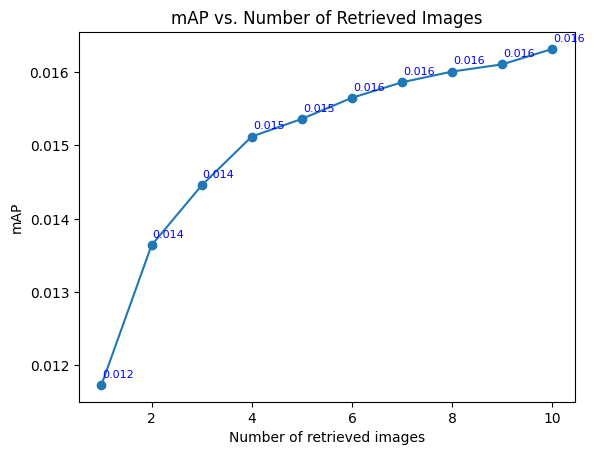

In [18]:
num_retrieved_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# Compute the mAP for each value of num_retrieved
mAP_list = []
for num_retrieved in num_retrieved_list:
    mAP = my_holidays_map('myresults.dat', num_retrieved=num_retrieved)
    mAP_list.append(mAP)

# Plot the mAP values vs. num_retrieved
plt.plot(num_retrieved_list, mAP_list, '-o')
plt.xlabel('Number of retrieved images')
plt.ylabel('mAP')
plt.title('mAP vs. Number of Retrieved Images')

# Annotate the mAP values on the plot
for i, mAP in enumerate(mAP_list):
    plt.annotate('{:.3f}'.format(mAP), xy=(num_retrieved_list[i], mAP),
                 xytext=(num_retrieved_list[i]+0.02, mAP+0.0001),
                 fontsize=8, color='blue')

plt.show()

# Improving the image descriptors and similarity metrics

### 1. gray level vs color histogram

In [19]:

import skimage.color
import skimage.io
import skimage.exposure
def load_images_from_folder(folder):
    images = []
    names = []
    for filename in os.listdir(folder):
        img = skimage.io.imread(os.path.join(folder, filename))
        names.append(filename)
        if img is not None:
            # Convert the image to grayscale
            img_gray = skimage.color.rgb2gray(img)
            # Calculate the grayscale histogram
            hist_gray, _ = skimage.exposure.histogram(img_gray)
            # Calculate the color histogram
            img_rgb = skimage.color.gray2rgb(img_gray)
            hist_color, _ = skimage.exposure.histogram(img_rgb, nbins=(16, 16, 16))
            # Concatenate the grayscale and color histograms
            hist = np.concatenate([hist_gray, hist_color])
            images.append(hist)
    return images, names

In [20]:
images1,names1=load_images_from_folder('smallholidays')

C:\Users\Dell\anaconda3\lib\site-packages\skimage\_shared\utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


In [21]:
def calculate_dist(item):
    distances = {}
    for i in range(len(images1)):
        distances[i] = np.linalg.norm(images1[item] - images1[i])
    sorted_dist = dict(OrderedDict(sorted(distances.items(), key=lambda t: t[1])))
    return sorted_dist

In [22]:
item=0
sorted_dist=calculate_dist(item)

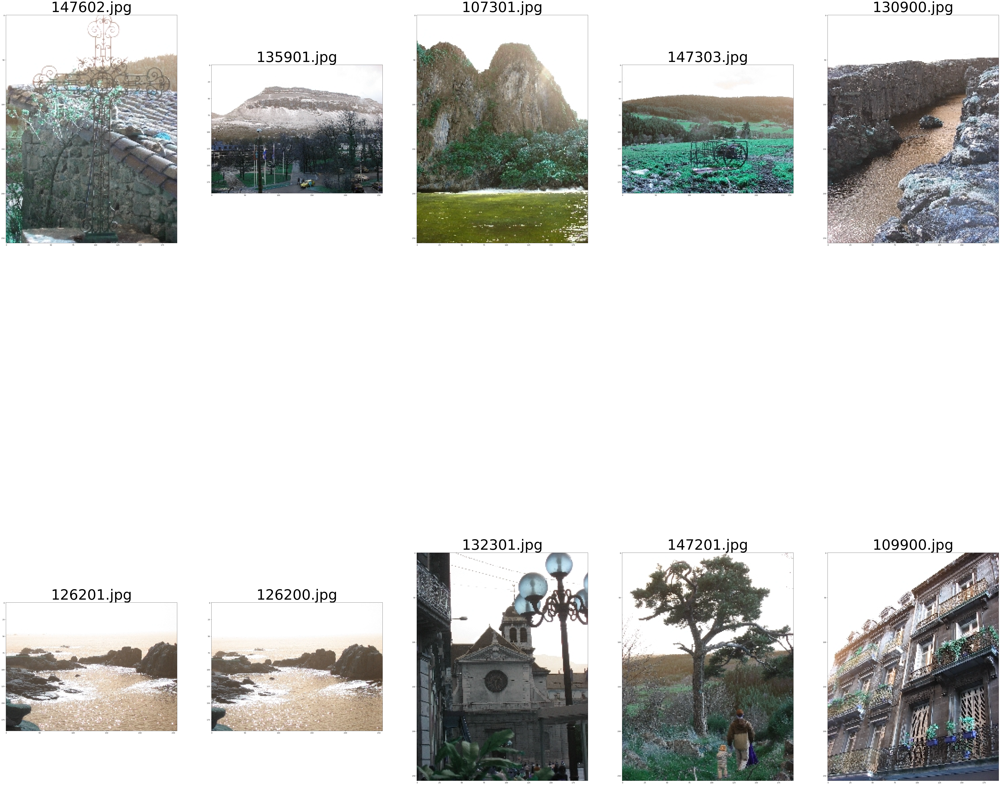

100000.jpg


In [23]:
nrows = 2
ncols = 5
plt.figure(figsize=(100,100))
keys=sorted_dist.keys()
first10=list(keys)[1:11]
# Loop through the images and plot them
for i in range(10):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(images[first10[i]])
    plt.title(names[first10[i]],fontsize=80)
# Show the plot
plt.show()

print(names[item])

In [24]:
all_distances=get_all_distances()

In [25]:
output_file_path = 'myresults1.dat'
write_results_file(all_distances, output_file_path)


In [26]:
mAP = my_holidays_map('myresults1.dat',1)
print(mAP)

500
0.1020484848484849


500
500
500
500
500
500
500
500
500
500


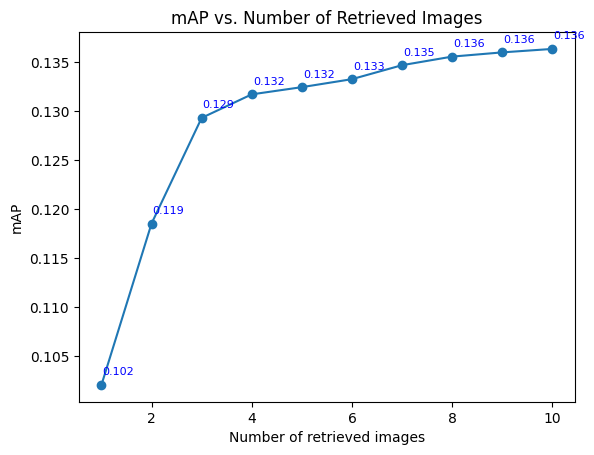

In [27]:
num_retrieved_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# Compute the mAP for each value of num_retrieved
mAP_list = []
for num_retrieved in num_retrieved_list:
    mAP = my_holidays_map('myresults1.dat', num_retrieved=num_retrieved)
    mAP_list.append(mAP)

# Plot the mAP values vs. num_retrieved
plt.plot(num_retrieved_list, mAP_list, '-o')
plt.xlabel('Number of retrieved images')
plt.ylabel('mAP')
plt.title('mAP vs. Number of Retrieved Images')

# Annotate the mAP values on the plot
for i, mAP in enumerate(mAP_list):
    plt.annotate('{:.3f}'.format(mAP), xy=(num_retrieved_list[i], mAP),
                 xytext=(num_retrieved_list[i]+0.02, mAP+0.001),
                 fontsize=8, color='blue')

plt.show()

### 2. HOG 

In [39]:
from skimage.feature import hog
# Compute the HOG descriptors for each image
vectors_hog = []
for i in images:
    i = cv2.resize(i, (16, 16))
    fd, hog_image = hog(i, orientations=8, pixels_per_cell=(16, 16),
                        cells_per_block=(1, 1), visualize=True, multichannel=True)
    vectors_hog.append(fd)

C:\Users\Dell\AppData\Local\Temp\ipykernel_7320\163308320.py:6: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fd, hog_image = hog(i, orientations=8, pixels_per_cell=(16, 16),


In [40]:
item=0
def calculate_dist(item):
    distances={}
    for i in range(len(vectors_hog)):

        distances[i]=np.linalg.norm(vectors_hog[item]-vectors_hog[i] )
    sorted_dist = dict(OrderedDict(sorted(distances.items(), key=lambda t: t[1])))
    return sorted_dist
sorted_dist=calculate_dist(item)
sorted_dist

{0: 0.0,
 2: 0.13762351186114902,
 144: 0.1445962592474772,
 256: 0.15145369909036172,
 119: 0.16079106848145278,
 1309: 0.16275048598296576,
 888: 0.19095157773056465,
 866: 0.19899854373047182,
 1296: 0.20438808319280924,
 1416: 0.2044584033259009,
 134: 0.21012678961830436,
 37: 0.21064921361124062,
 1196: 0.21216863069482605,
 864: 0.21537462539730842,
 670: 0.21827021406254812,
 100: 0.22142861040632547,
 178: 0.2229295929348812,
 634: 0.22298248753264294,
 733: 0.22363325582677124,
 909: 0.2273435851546559,
 239: 0.22880615226796622,
 1407: 0.23009849491425746,
 174: 0.23132230536206133,
 757: 0.23403622571491325,
 887: 0.2350782939962872,
 31: 0.2382942565339773,
 361: 0.23830125602773297,
 889: 0.2401040675973336,
 1443: 0.24127326947556282,
 815: 0.24127979596666935,
 177: 0.24397711496887034,
 461: 0.2442484812069,
 1298: 0.24424918128180223,
 1455: 0.24451830153547421,
 810: 0.24557729509614734,
 135: 0.24758580413721415,
 1450: 0.24772210026041924,
 759: 0.24919083254171553

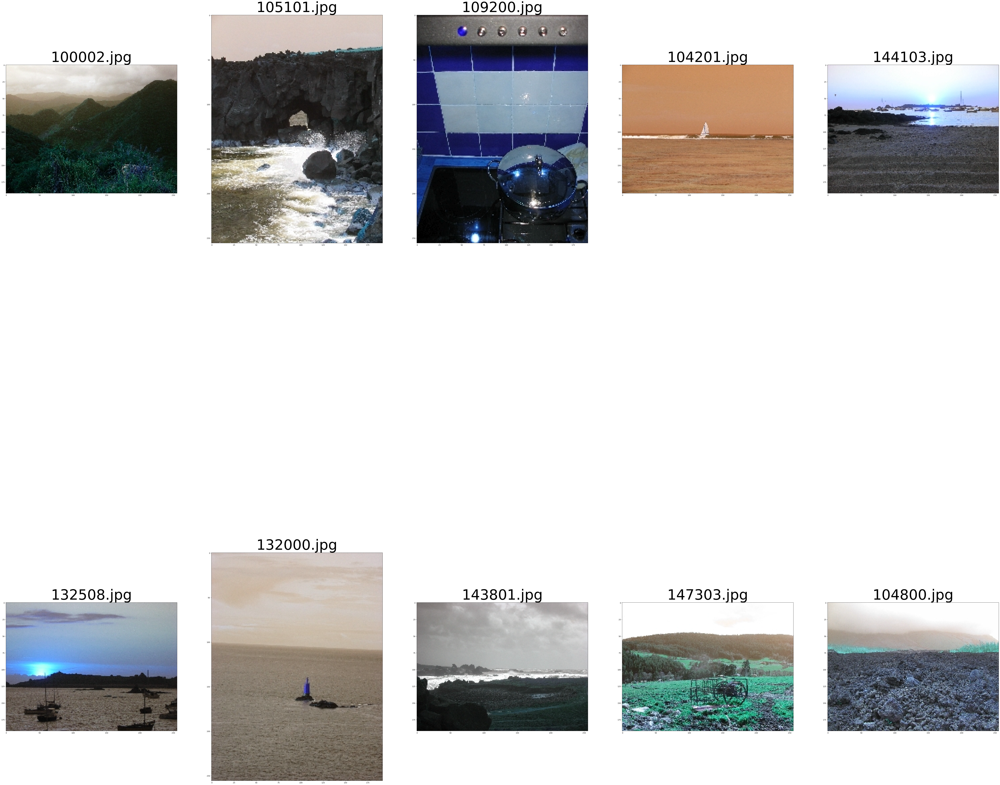

100000.jpg


In [30]:
nrows = 2
ncols = 5
plt.figure(figsize=(100,100))
keys=sorted_dist.keys()
first10=list(keys)[1:11]
# Loop through the images and plot them
for i in range(10):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(images[first10[i]])
    plt.title(names[first10[i]],fontsize=80)
# Show the plot
plt.show()

print(names[item])

In [31]:
all_distances=get_all_distances()

In [32]:
output_file_path = 'myresults2.dat'
write_results_file(all_distances, output_file_path)


In [33]:
mAP = my_holidays_map('myresults2.dat',1)
print(mAP)

500
0.01


500
500
500
500
500
500
500
500
500
500


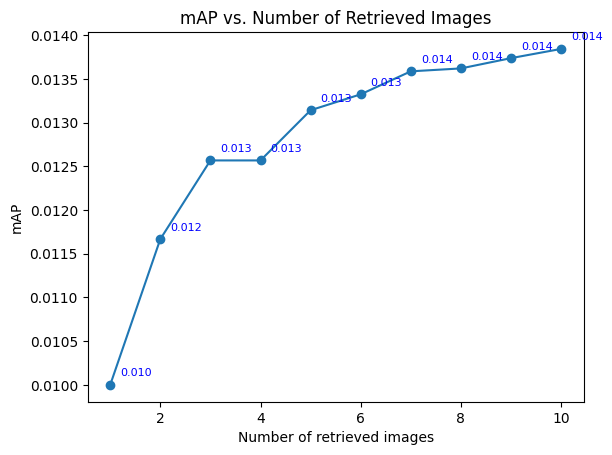

In [34]:
num_retrieved_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# Compute the mAP for each value of num_retrieved
mAP_list = []
for num_retrieved in num_retrieved_list:
    mAP = my_holidays_map('myresults2.dat', num_retrieved=num_retrieved)
    mAP_list.append(mAP)

# Plot the mAP values vs. num_retrieved
plt.plot(num_retrieved_list, mAP_list, '-o')
plt.xlabel('Number of retrieved images')
plt.ylabel('mAP')
plt.title('mAP vs. Number of Retrieved Images')

# Annotate the mAP values on the plot
for i, mAP in enumerate(mAP_list):
    plt.annotate('{:.3f}'.format(mAP), xy=(num_retrieved_list[i], mAP),
                 xytext=(num_retrieved_list[i]+0.2, mAP+0.0001),
                 fontsize=8, color='blue')


# Bag of Visual Words

In [43]:
def load_images_from_folder2(folder):
    images = []
    names=[]
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        names.append(filename)
        if img is not None:
            img=cv2.resize(img,(16,16))
            images.append(img)
    return images,names

In [76]:
from sklearn.cluster import MiniBatchKMeans
import numpy as np
from sklearn.cluster import KMeans

def get_patches(img, patch_size):
    h, w,_ = img.shape
    ph, pw = patch_size
    patches = []
    for i in range(0, h-ph+1, ph):
        for j in range(0, w-pw+1, pw):
            patch = img[i:i+ph, j:j+pw]
            patches.append(patch.flatten())
    return np.array(patches)

def get_all_patches(images, patch_size):
    all_patches = []
    for img in images:
        patches = get_patches(img, patch_size)
        all_patches.extend(patches)
    return np.array(all_patches)

def get_visual_words(patches, num_clusters):
    kmeans = MiniBatchKMeans(n_clusters=num_clusters)
    kmeans.fit(patches)
    return kmeans.cluster_centers_

def get_assignments(img, visual_words, patch_size):
    patches = get_patches(img, patch_size)
    distances = np.linalg.norm(patches[:,None,:] - visual_words[None,:,:], axis=2)
    assignments = np.argmin(distances, axis=1)
    return assignments

def get_histogram(assignments, num_clusters):
    histogram, _ = np.histogram(assignments, bins=num_clusters, range=(0,num_clusters-1))
    return histogram

def bovw(images, patch_size=(8,8), num_clusters=20):
    all_patches = get_all_patches(images, patch_size)
    visual_words = get_visual_words(all_patches, num_clusters)
    histograms = []
    for img in images:
        assignments = get_assignments(img, visual_words, patch_size)
        histogram = get_histogram(assignments, num_clusters)
        histograms.append(histogram)
    return np.array(histograms)

In [90]:
images, _ = load_images_from_folder2('smallholidays')

In [101]:
histograms = bovw(images, patch_size=(6,6))

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [102]:
import scipy.spatial.distance as dist
def predict_relevant_images(item):
    distances = {}
    for i in range(len(histograms)):
        distance = dist.euclidean(item, histograms[i])
        distances[i]=distance
    sorted_dist = dict(OrderedDict(sorted(distances.items(), key=lambda t: t[1])))
    return sorted_dist

In [103]:
sorted_dist=predict_relevant_images(histograms[item])
sorted_dist

{0: 0.0,
 893: 0.0,
 1432: 0.0,
 72: 1.4142135623730951,
 135: 1.4142135623730951,
 185: 1.4142135623730951,
 314: 1.4142135623730951,
 321: 1.4142135623730951,
 363: 1.4142135623730951,
 440: 1.4142135623730951,
 502: 1.4142135623730951,
 586: 1.4142135623730951,
 609: 1.4142135623730951,
 610: 1.4142135623730951,
 611: 1.4142135623730951,
 700: 1.4142135623730951,
 720: 1.4142135623730951,
 774: 1.4142135623730951,
 784: 1.4142135623730951,
 842: 1.4142135623730951,
 935: 1.4142135623730951,
 994: 1.4142135623730951,
 1199: 1.4142135623730951,
 1200: 1.4142135623730951,
 1218: 1.4142135623730951,
 1219: 1.4142135623730951,
 1302: 1.4142135623730951,
 1308: 1.4142135623730951,
 1309: 1.4142135623730951,
 1357: 1.4142135623730951,
 1387: 1.4142135623730951,
 1425: 1.4142135623730951,
 1454: 1.4142135623730951,
 12: 2.0,
 22: 2.0,
 38: 2.0,
 39: 2.0,
 85: 2.0,
 125: 2.0,
 131: 2.0,
 134: 2.0,
 142: 2.0,
 150: 2.0,
 181: 2.0,
 182: 2.0,
 186: 2.0,
 217: 2.0,
 222: 2.0,
 224: 2.0,
 230: 2

In [104]:
def get_all_distances():
    all_distances={}
    for i in query_index:
        dist=predict_relevant_images(histograms[i])
        all_distances[names[i]]=[names[i] for i in dist.keys()]
    return all_distances
all_distances=get_all_distances()

In [105]:
output_file_path = 'myresults3.dat'
write_results_file(all_distances, output_file_path)

In [106]:
mAP = my_holidays_map('myresults3.dat',1)
print(mAP)

500
0.02165


500
500
500
500
500
500
500
500
500
500


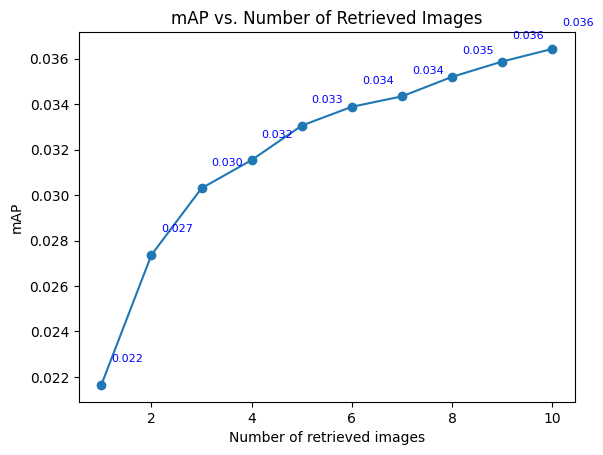

In [112]:
num_retrieved_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# Compute the mAP for each value of num_retrieved
mAP_list = []
for num_retrieved in num_retrieved_list:
    mAP = my_holidays_map('myresults3.dat', num_retrieved=num_retrieved)
    mAP_list.append(mAP)

# Plot the mAP values vs. num_retrieved
plt.plot(num_retrieved_list, mAP_list, '-o')
plt.xlabel('Number of retrieved images')
plt.ylabel('mAP')
plt.title('mAP vs. Number of Retrieved Images')

# Annotate the mAP values on the plot
for i, mAP in enumerate(mAP_list):
    plt.annotate('{:.3f}'.format(mAP), xy=(num_retrieved_list[i], mAP),
                 xytext=(num_retrieved_list[i]+0.2, mAP+0.001),
                 fontsize=8, color='blue')

# resnet50

In [113]:
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.preprocessing import image
import numpy as np

# Load the pre-trained ResNet50 model
model = ResNet50(weights='imagenet', include_top=False, pooling='avg')



94765736/94765736 [==============================] - 20s 0us/step


In [124]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array
def load_images(folder):
    images_features = []
    names=[]
    for filename in os.listdir(folder):
        img = load_img(os.path.join(folder,filename),target_size=(224,224))
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        # Extract the features
        features = model.predict(x)
        names.append(filename)
        if img is not None:
            images_features.append(features)
    return images_features,names

In [125]:
features,names=load_images('smallholidays')

1/1 [==============================] - 0s 169ms/step


1/1 [==============================] - 0s 172ms/step


1/1 [==============================] - 0s 253ms/step


1/1 [==============================] - 0s 172ms/step


1/1 [==============================] - 0s 171ms/step


In [126]:
item=0
def calculate_dist(item):
    distances={}
    for i in range(len(features)):

        distances[i]=np.linalg.norm(features[item]-features[i] )
    sorted_dist = dict(OrderedDict(sorted(distances.items(), key=lambda t: t[1])))
    return sorted_dist
sorted_dist=calculate_dist(item)
sorted_dist

{0: 0.0,
 1: 11.94738,
 15: 19.82279,
 12: 21.041084,
 2: 21.86185,
 14: 22.426956,
 13: 23.002975,
 63: 23.29109,
 343: 23.46162,
 7: 23.485516,
 10: 23.975353,
 65: 24.044884,
 908: 24.232098,
 342: 25.705744,
 371: 25.9152,
 306: 25.950949,
 64: 26.076078,
 399: 26.133793,
 307: 26.280466,
 788: 26.319744,
 5: 26.563828,
 72: 26.642365,
 1203: 26.711634,
 759: 26.788532,
 774: 26.92141,
 11: 26.98696,
 763: 27.208061,
 318: 27.436514,
 150: 27.77171,
 316: 27.782728,
 400: 27.7888,
 758: 27.85681,
 1204: 27.904058,
 265: 28.023174,
 314: 28.190073,
 1411: 28.350327,
 915: 28.35647,
 73: 28.406866,
 1331: 28.442425,
 952: 28.485615,
 1378: 28.596443,
 1376: 28.627373,
 1372: 28.819466,
 39: 28.896605,
 313: 28.90099,
 783: 28.928036,
 1381: 29.089577,
 68: 29.227978,
 151: 29.241667,
 986: 29.522293,
 208: 29.54428,
 383: 29.581223,
 542: 29.607357,
 909: 29.632696,
 1449: 29.77602,
 370: 29.809855,
 951: 29.818483,
 1329: 29.82491,
 266: 29.876614,
 745: 29.980295,
 985: 30.005692,


In [128]:
def get_all_distances():
    all_distances={}
    for i in query_index:
        dist=calculate_dist(i)
        all_distances[names[i]]=[names[i] for i in dist.keys()]
    return all_distances
all_distances=get_all_distances()

In [129]:
output_file_path = 'myresults4.dat'
write_results_file(all_distances, output_file_path)

In [133]:
mAP = my_holidays_map('myresults4.dat',1)
print(mAP)

500
0.5426143578643581


500
500
500
500
500
500
500
500
500
500


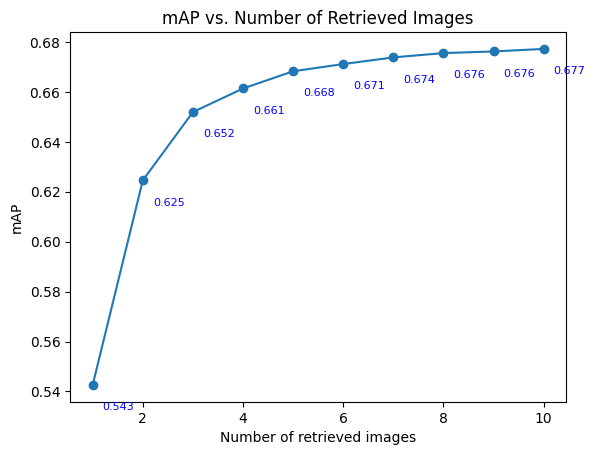

In [139]:
num_retrieved_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# Compute the mAP for each value of num_retrieved
mAP_list = []
for num_retrieved in num_retrieved_list:
    mAP = my_holidays_map('myresults4.dat', num_retrieved=num_retrieved)
    mAP_list.append(mAP)

# Plot the mAP values vs. num_retrieved
plt.plot(num_retrieved_list, mAP_list, '-o')
plt.xlabel('Number of retrieved images')
plt.ylabel('mAP')
plt.title('mAP vs. Number of Retrieved Images')

# Annotate the mAP values on the plot
for i, mAP in enumerate(mAP_list):
    plt.annotate('{:.3f}'.format(mAP), xy=(num_retrieved_list[i], mAP),
                 xytext=(num_retrieved_list[i]+0.2, mAP-0.01),
                 fontsize=8, color='blue')